# Step 2 | Baselining

In [ ]:
#######################
# standard code block #
#######################

%pylab inline

# sets backend to render higher res images
%config InlineBackend.figure_formats = ['retina']

#######################
#       imports       #
#######################

# standard data munging modules
import numpy as np
import pandas as pd
import random
import collections
from collections import defaultdict

# visualization modules
import matplotlib.image as img
import matplotlib.pyplot as plt
import seaborn as sns

# file and directory operations modules
import os
import simplejson as json
from pathlib import Path
from os import listdir
from os.path import isfile, join
import cv2
from PIL import Image
from shutil import copy
from shutil import copyfile
from shutil import copytree, rmtree

# standard modeling modules
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

# deep learning modules
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image as keras_image
from keras.preprocessing.image import load_img

# fastai
import fastai.vision as fv
from fastai.vision import show_image
from fastai.vision import open_image

sns.set_style("whitegrid")

## Image Preprocessing

### 1. Resize Test images

In [2]:
# existing paths
path_meta = '/Users/valentinarizzati/Desktop/GitStuff/Projects/DeepLearning-Instagram/data/food_101/food-101/food-101/meta/'
path_images = '/Users/valentinarizzati/Desktop/GitStuff/Projects/DeepLearning-Instagram/data/food_101/food-101/food-101/images/'
path_test = '/Users/valentinarizzati/Desktop/GitStuff/Projects/DeepLearning-Instagram/data/food_101/food-101/food-101/images/split/test'
path_train = '/Users/valentinarizzati/Desktop/GitStuff/Projects/DeepLearning-Instagram/data/food_101/food-101/food-101/images/split/train'

# new paths
path_test_resized = path_images+'resized/test'
path_train_resized = path_images+'resized/train'

In [3]:
# make directories
os.makedirs(path_test_resized, exist_ok=True)

In [4]:
# load json of test filenames
test_json = open(str(path_meta)+'/test.json', 'r')
test_json = json.load(test_json)
classes_test = list(test_json.keys())

In [5]:
# iterate over food classes, copy resized test files over from the test directory to the resized directory
for food_class in classes_test:
    os.makedirs(path_test_resized+'/'+food_class, exist_ok=True)
    images = test_json[food_class]
    
    for image in images:
        image_name = image + '.jpg'
        if os.path.isfile(path_test+'/'+image_name):
            im = Image.open(path_test+'/'+image_name)
            resized_image = im.resize((299,229), Image.ANTIALIAS)
            resized_image.save(path_test_resized+'/'+image_name)

In [6]:
# plot images by image class
def food_class_images(image_class, count, folder='test/'):
    food_class_path = path_images+'/resized/'+folder+image_class # find path to food class folder
    food_class_files = os.listdir(food_class_path) # list image files
    food_class_images = [open_image(food_class_path+'/'+food_class_files[i]) for i in range(count)] # count number of images
    return food_class_images

def plot_food_class(image_class, count, folder='test/', rows=4, cols=4, figsize=(25,25)):
    images = food_class_images(image_class, count) # get images
    fig, axes = plt.subplots(rows, cols, figsize=figsize) # get plots
    fig.suptitle(image_class) # label plot
    
    for i, ax in enumerate(axes.flat):
        show_image(images[i], ax=ax) # plot images
        
    plt.subplots_adjust(wspace=None, hspace=None)

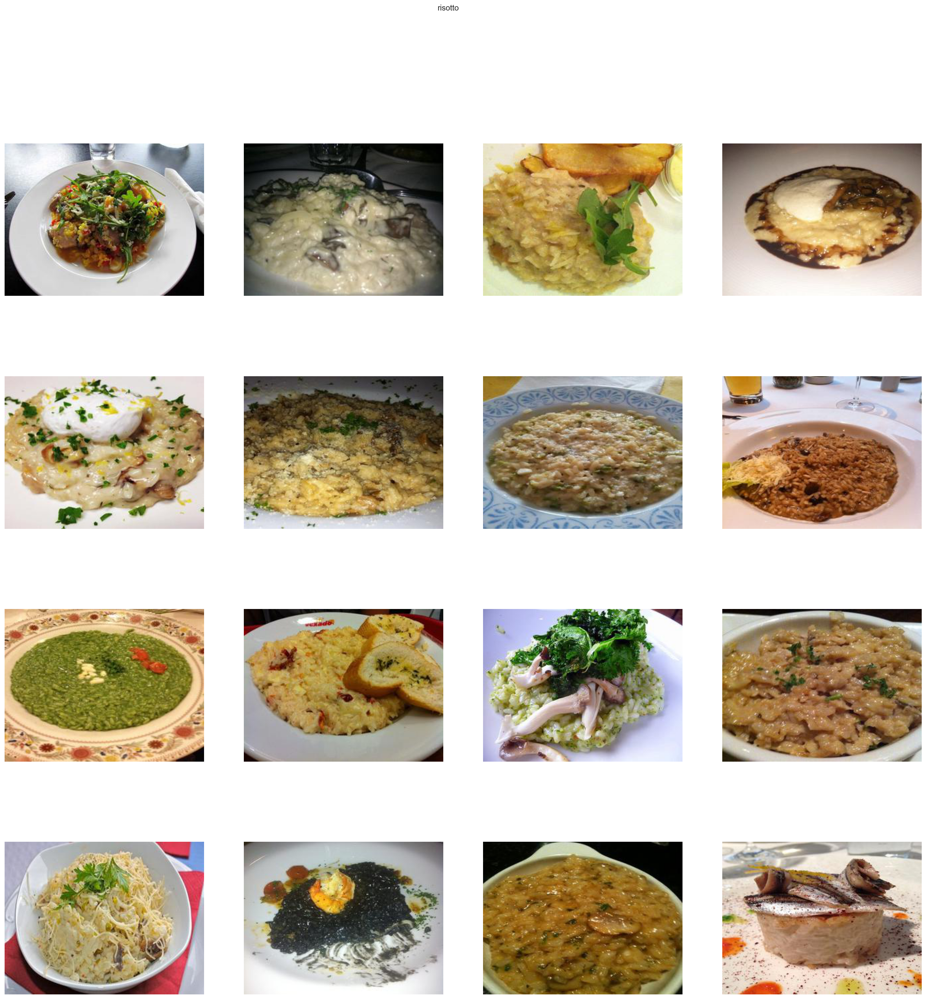

In [7]:
plot_food_class('risotto', 20)

> As we see from the image sizes above, the resizing seems to have been correctly executed.

### 2. Resize Train images

In [8]:
# load json of test filenames
train_json = open(str(path_meta)+'/train.json', 'r')
train_json = json.load(train_json)
classes_train = list(train_json.keys())

In [9]:
# iterate over food classes, copy resized train files over from the train directory to the resized directory
for food_class in classes_train:
    os.makedirs(path_train_resized+'/'+food_class, exist_ok=True)
    images = train_json[food_class]
    
    for image in images:
        image_name = image + '.jpg'
        if os.path.isfile(path_train+'/'+image_name):
            im = Image.open(path_train+'/'+image_name)
            resized_image = im.resize((299,229), Image.ANTIALIAS)
            resized_image.save(path_train_resized+'/'+image_name)

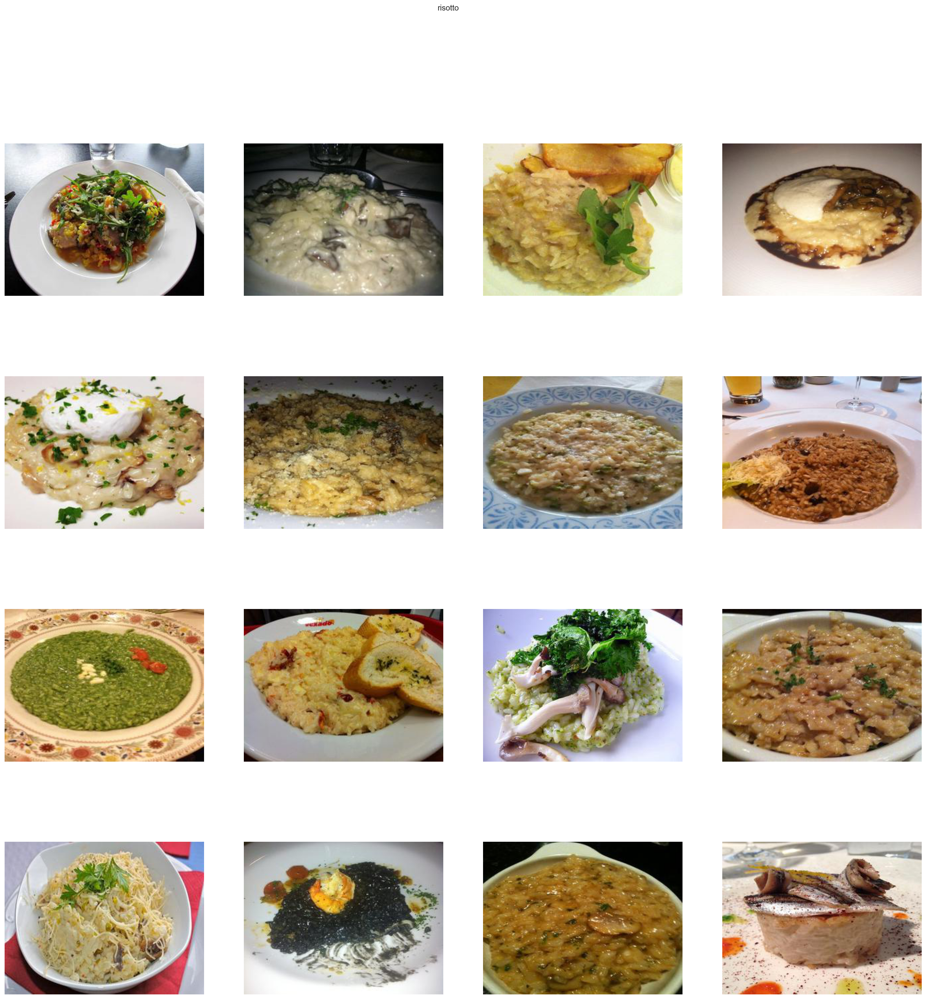

In [10]:
plot_food_class('risotto', 20, 'train/')

> As we see from the image sizes above, the resizing seems to have been correctly executed.

### 3. Image resizing sanity check

Let's now do a final sanity check by plotting image sizes.

In [11]:
# collect information about images in train and test folders
resized_data = fv.ImageList.from_folder(path_images+'/resized').split_by_folder(train='train', valid='test').label_from_folder(classes=None)

# define image data
resized_image_data_valid = [[i[0].shape[1], i[0].shape[2], i[1].obj] for i in resized_data.valid]

# define image data
resized_image_data_train = [[i[0].shape[1], i[0].shape[2], i[1].obj] for i in resized_data.train]

# create df of images
image_resized_valid_df = pd.DataFrame(resized_image_data_valid, columns=['height', 'width', 'class'])
image_resized_train_df = pd.DataFrame(resized_image_data_train, columns=['height', 'width', 'class'])

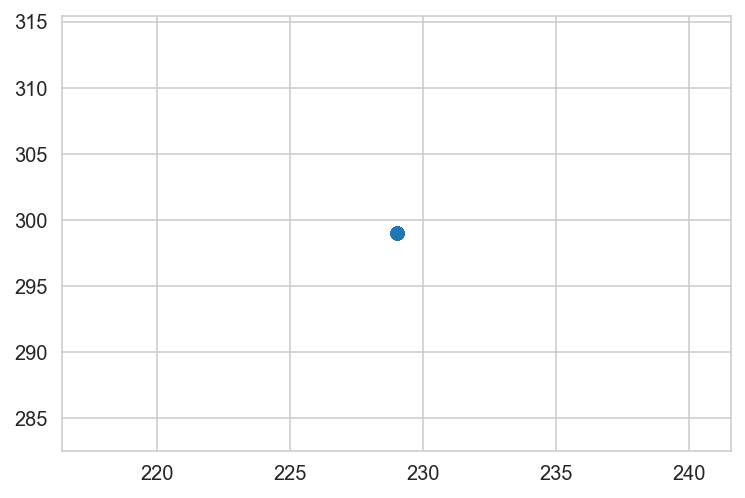

In [12]:
# scatter of width and height values
plt.scatter(image_resized_valid_df['height'], image_resized_valid_df['width']);

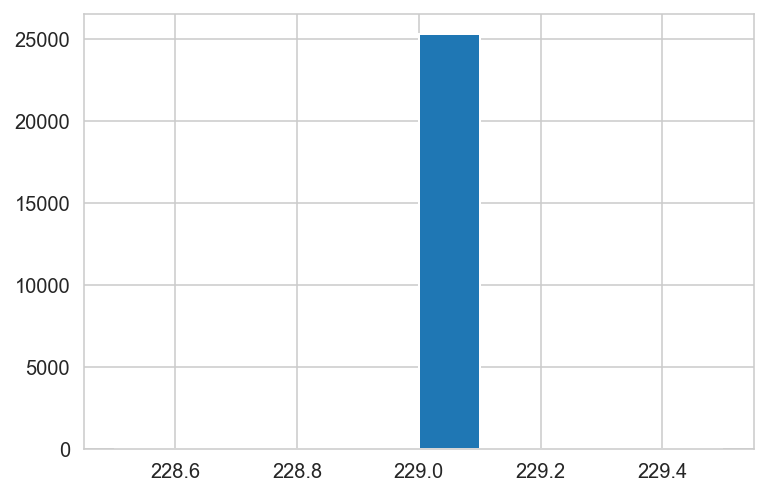

In [13]:
# histogram of image heights
plt.hist(image_resized_valid_df['height']);

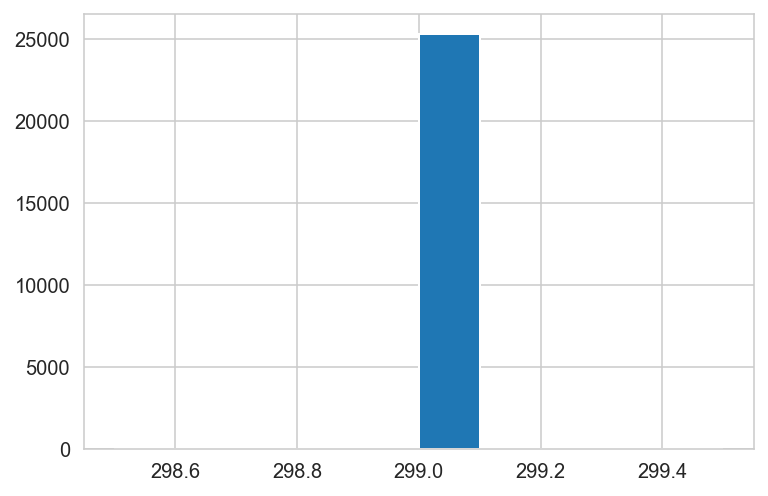

In [14]:
# histogram of image widths
plt.hist(image_resized_valid_df['width']);

In [15]:
image_resized_valid_df['height'].value_counts()

229    25250
Name: height, dtype: int64

In [16]:
image_resized_valid_df['width'].value_counts()

299    25250
Name: width, dtype: int64

In [17]:
image_resized_train_df['height'].value_counts()

229    75750
Name: height, dtype: int64

In [18]:
image_resized_train_df['width'].value_counts()

299    75750
Name: width, dtype: int64

----

All images have been resized correctly to **299 x 299**.

----

## Create image x pixel dataframe

### 1. New simplified directory for baseline model

For the purpose of simplifying the creation of a logistic regression baseline, I will create a new directory:
* 201 images per class for 101 food classes
* images resized to 128 x 128 to reduce complexity
* images grayscaled to reduce complexity

In [93]:
# create new directory to store a subset of food images
path_train_resized_baseline = path_images+'resized_baseline/train'

In [94]:
# make directory
os.makedirs(path_train_resized_baseline, exist_ok=True)

In [111]:
# iterate over food classes, copy resized train files over from the train directory to the resized directory
for food_class in classes_train:
    os.makedirs(path_train_resized_baseline+'/'+food_class, exist_ok=True)
    images = train_json[food_class]
    
    for image in images[:201]:
        image_name_list = image.split('/') # split image name from class name
        class_name = image_name_list[0]
        image_name = image_name_list[1] + '.jpg'
        if os.path.isfile(path_train+'/'+class_name+'/'+image_name):            
            im = load_img(path_train+'/'+class_name+'/'+image_name, grayscale=True)
            resized_im = im.resize((128,128), Image.ANTIALIAS)
            resized_im.save(path_train_resized_baseline+'/'+class_name+'/'+image_name)

In [117]:
# plot images by image class
def food_class_img(image_class, count, path_to_folder):
    food_class_path = path_to_folder+'/'+image_class # find path to food class folder
    food_class_files = os.listdir(food_class_path) # list image files
    food_class_images = [open_image(food_class_path+'/'+food_class_files[i]) for i in range(count)] # count number of images
    return food_class_images

def plot_food_cl(image_class, count, path_to_folder, rows=4, cols=4, figsize=(25,25)):
    images = food_class_img(image_class, count, path_train_resized_baseline) # get images
    fig, axes = plt.subplots(rows, cols, figsize=figsize) # get plots
    fig.suptitle(image_class) # label plot
    
    for i, ax in enumerate(axes.flat):
        show_image(images[i], ax=ax) # plot images
        
    plt.subplots_adjust(wspace=None, hspace=None)

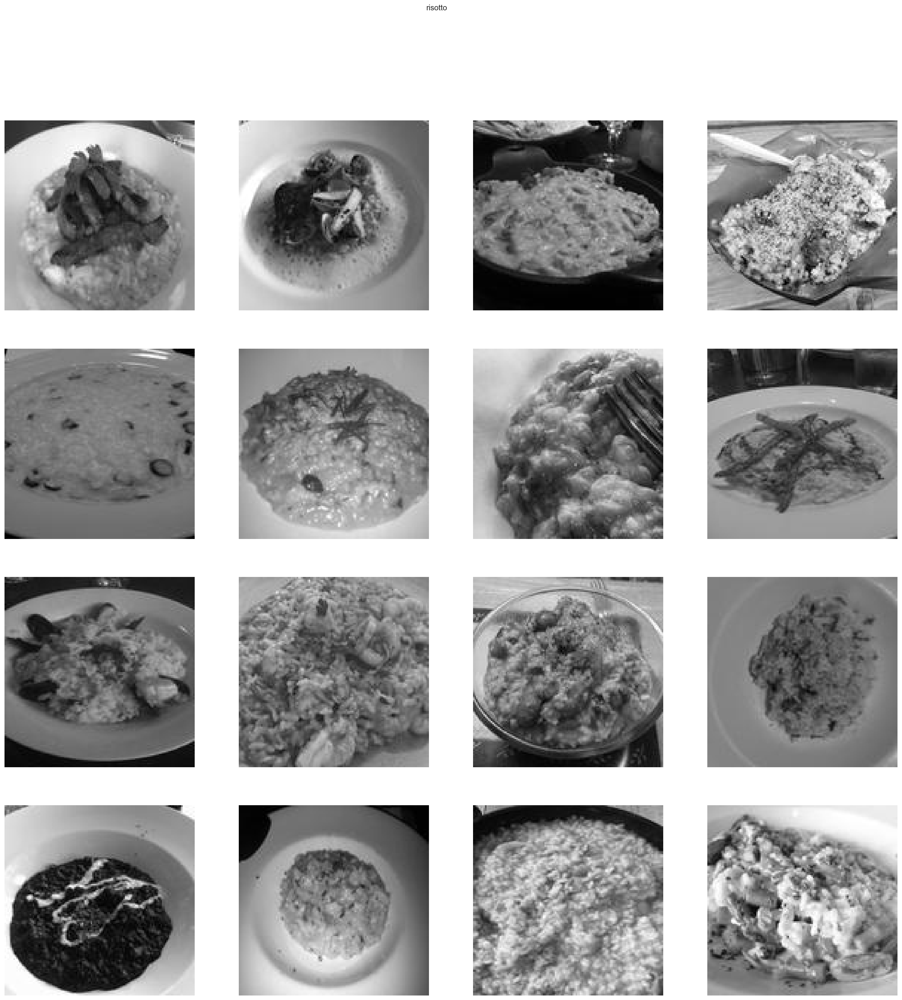

In [118]:
plot_food_cl('risotto',20,path_train_resized_baseline)

> Images have been modified correctly. We can proceed for the next step in converting images to vectors.

### 2. Build Train dataframe for baseline

In [184]:
img_array=[]
class_name=[]
img_name=[]

def create_image_df(img_folder): # path_resized_baseline_train
   
    for img_class_subfolder in os.listdir(img_folder):
        if img_class_subfolder == '.DS_Store':
            continue
        for file in os.listdir(os.path.join(img_folder, img_class_subfolder)):
       
            image_path= os.path.join(img_folder, img_class_subfolder,  file)
            
            img = keras_image.load_img(image_path, target_size=(128, 128),color_mode = "grayscale")
            x = keras_image.img_to_array(img)
            x = x/255
            x = np.expand_dims(x, axis=0)
            x = np.transpose(x.flatten())
            
            # append to list
            img_array.append(x)
            class_name.append(img_class_subfolder)
            img_name.append(file)
    
    # create df and concatenate 3 elements
    df_img_array = pd.DataFrame(data = img_array)
    df_name = pd.DataFrame({'img_id':img_name})    
    df_class = pd.DataFrame({'class_name':class_name})
            
    # merge dataframes
    img_df_temp = df_img_array.merge(df_name, left_index=True, right_index=True)
    img_df = img_df_temp.merge(df_class, left_index=True, right_index=True)
               
    return img_df

In [185]:
create_image_df(path_train_resized_baseline+'/')

,0,1,2,3,4,5,6,7,8,9,...,16376,16377,16378,16379,16380,16381,16382,16383,img_id,class_name
0,0.674510,0.674510,0.674510,0.674510,0.674510,0.674510,0.674510,0.674510,0.694118,0.694118,...,0.788235,0.788235,0.796078,0.803922,0.811765,0.807843,0.792157,0.780392,1244707.jpg,foie_gras
1,0.447059,0.400000,0.360784,0.380392,0.423529,0.419608,0.352941,0.282353,0.152941,0.176471,...,0.721569,0.709804,0.694118,0.674510,0.658824,0.639216,0.615686,0.600000,1762912.jpg,foie_gras
2,0.027451,0.015686,0.007843,0.011765,0.023529,0.031373,0.027451,0.019608,0.039216,0.015686,...,0.835294,0.831373,0.823529,0.811765,0.800000,0.792157,0.784314,0.780392,1176321.jpg,foie_gras
3,0.015686,0.019608,0.027451,0.035294,0.035294,0.027451,0.019608,0.015686,0.015686,0.019608,...,0.913725,0.921569,0.929412,0.937255,0.941176,0.933333,0.929412,0.925490,1680834.jpg,foie_gras
4,0.047059,0.050980,0.070588,0.086275,0.066667,0.031373,0.031373,0.054902,0.078431,0.070588,...,0.274510,0.047059,0.043137,0.015686,0.047059,0.050980,0.125490,0.168627,1051563.jpg,foie_gras
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20296,0.250980,0.345098,0.419608,0.392157,0.478431,0.423529,0.435294,0.470588,0.384314,0.294118,...,0.286275,0.580392,0.725490,0.756863,0.600000,0.360784,0.250980,0.109804,1397383.jpg,caesar_salad
20297,0.160784,0.164706,0.172549,0.184314,0.192157,0.196078,0.196078,0.200000,0.188235,0.192157,...,0.941176,0.811765,0.501961,0.658824,0.815686,0.811765,0.764706,0.792157,126205.jpg,caesar_salad
20298,0.317647,0.345098,0.376471,0.396078,0.403922,0.411765,0.427451,0.443137,0.419608,0.372549,...,0.403922,0.407843,0.407843,0.407843,0.392157,0.352941,0.298039,0.262745,15081.jpg,caesar_salad
20299,0.239216,0.227451,0.211765,0.192157,0.188235,0.203922,0.235294,0.258824,0.290196,0.294118,...,0.176471,0.176471,0.176471,0.176471,0.176471,0.176471,0.172549,0.172549,1351688.jpg,caesar_salad


In [245]:
# reorder cols
cols_to_order = ['img_id', 'class_name']
new_columns = cols_to_order + (img_df.columns.drop(cols_to_order).tolist())
image_df = img_df[new_columns]

In [246]:
image_df.head()

,img_id,class_name,0,1,2,3,4,5,6,7,...,16374,16375,16376,16377,16378,16379,16380,16381,16382,16383
0,1244707.jpg,foie_gras,0.674510,0.674510,0.674510,0.674510,0.674510,0.674510,0.674510,0.674510,...,0.772549,0.784314,0.788235,0.788235,0.796078,0.803922,0.811765,0.807843,0.792157,0.780392
1,1762912.jpg,foie_gras,0.447059,0.400000,0.360784,0.380392,0.423529,0.419608,0.352941,0.282353,...,0.725490,0.717647,0.721569,0.709804,0.694118,0.674510,0.658824,0.639216,0.615686,0.600000
2,1176321.jpg,foie_gras,0.027451,0.015686,0.007843,0.011765,0.023529,0.031373,0.027451,0.019608,...,0.858824,0.847059,0.835294,0.831373,0.823529,0.811765,0.800000,0.792157,0.784314,0.780392
3,1680834.jpg,foie_gras,0.015686,0.019608,0.027451,0.035294,0.035294,0.027451,0.019608,0.015686,...,0.929412,0.917647,0.913725,0.921569,0.929412,0.937255,0.941176,0.933333,0.929412,0.925490
4,1051563.jpg,foie_gras,0.047059,0.050980,0.070588,0.086275,0.066667,0.031373,0.031373,0.054902,...,0.686275,0.682353,0.274510,0.047059,0.043137,0.015686,0.047059,0.050980,0.125490,0.168627


In [189]:
# pickle df
im_df = image_df.to_pickle("image_df.pickle")

## Baseline Model

Because of the high dimensionality the non-linear nature of my data (i.e. non linearly separable classes), I will build a **random forest** as my baseline model. 

In [251]:
# define features and target
features = image_df.iloc[:,2:]
target = image_df.iloc[:,1:2]

In [277]:
# hold out 25% of the data for validation
X_train, X_val, y_train, y_val = train_test_split(features, target, test_size=.25, random_state=42)

# define labels
y_train_label = y_train.values.astype(object)
y_val_label = y_val.values.astype(object)

# transform non numerical labels into numerical labels
encoder = preprocessing.LabelEncoder()

# encode train labels 
encoder.fit(y_train_label.ravel())
y_train = encoder.transform(y_train_label)

# encode test labels 
encoder.fit(y_val_label.ravel())
y_val = encoder.transform(y_val_label)


# Scaling the Train and Test feature set 
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# initiate RF classifier and fit the model on training data
rf_cl = RandomForestClassifier(n_estimators=100, criterion = 'gini', bootstrap=True, n_jobs = -1, random_state=42, max_features='sqrt')
rf_cl.fit(X_train_scaled, y_train) #.values.ravel()

# prediction on test data
y_pred = rf_cl.predict(X_val_scaled)

# compute F1 and accuracy
f1 = f1_score(y_val, y_pred, average = 'macro')
accuracy = accuracy_score(y_val, y_pred)

print(f'Random Forest | Validation Accuracy: \t{accuracy} | Validation F1 score: \t{f1} \n')

Random Forest | Validation Accuracy: 	0.02797478329393223 | Validation F1 score: 	0.02436247461531489 



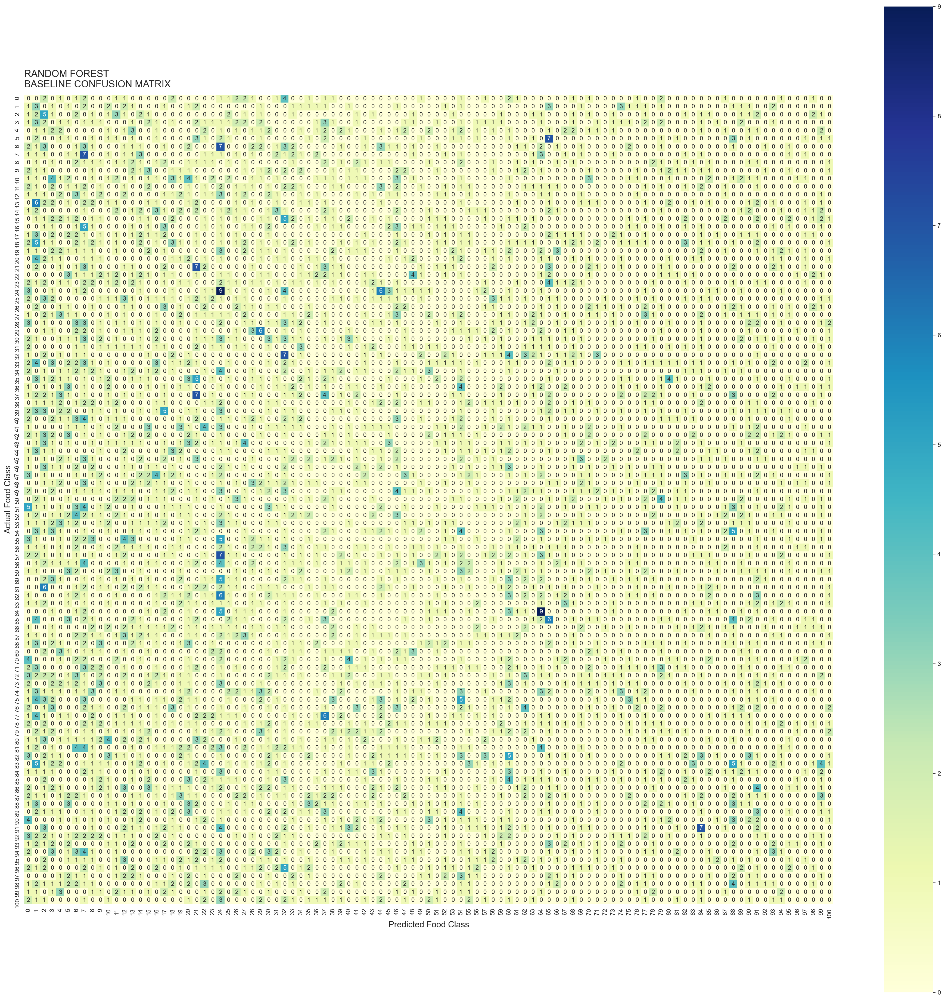

In [282]:
# Confusion Matrix

rf_confusion = confusion_matrix(y_val, y_pred)
plt.figure(figsize=(30, 30), dpi=80)
sns.heatmap(rf_confusion, cmap = "YlGnBu", annot=True, square=True, fmt=".0f")

plt.xlabel('Predicted Food Class',fontsize = 14)
plt.ylabel('Actual Food Class',fontsize = 14)
plt.title('RANDOM FOREST\nBASELINE CONFUSION MATRIX', fontsize = 16, loc = 'left', pad = 12);

----

As we can see from the accuracy and F1 score results above, as well as from scanning the confusion matrix, **random forest performs poorly** on image classification task for multiclass data. We'll then proceed with testing some Convolutional Neural Nets. 

----